In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB

from nltk.corpus import stopwords



### Task 1: Select a dataset of your choice or a dataset given in this link.
https://www.kaggle.com/datasets/rmisra/news-category-dataset


#### Performing basic EDA of the dataset (along with Visualization of data):

In [2]:
df = pd.read_json("News_Category_Dataset_v3.json", lines=True)

In [3]:
df.shape

(209527, 6)

In [6]:
df.head()

,link,headline,category,short_description,authors,date
0,https://www.huffpost.com/entry/covid-boosters-...,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,"Carla K. Johnson, AP",2022-09-23
1,https://www.huffpost.com/entry/american-airlin...,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,Mary Papenfuss,2022-09-23
2,https://www.huffpost.com/entry/funniest-tweets...,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"""Until you have a dog you don't understand wha...",Elyse Wanshel,2022-09-23
3,https://www.huffpost.com/entry/funniest-parent...,The Funniest Tweets From Parents This Week (Se...,PARENTING,"""Accidentally put grown-up toothpaste on my to...",Caroline Bologna,2022-09-23
4,https://www.huffpost.com/entry/amy-cooper-lose...,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,Nina Golgowski,2022-09-22


In [10]:
df.describe()

,date
count,209527
mean,2015-04-30 00:44:14.344308736
min,2012-01-28 00:00:00
25%,2013-08-10 00:00:00
50%,2015-03-16 00:00:00
75%,2016-11-01 00:00:00
max,2022-09-23 00:00:00


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209527 entries, 0 to 209526
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   link               209527 non-null  object        
 1   headline           209527 non-null  object        
 2   category           209527 non-null  object        
 3   short_description  209527 non-null  object        
 4   authors            209527 non-null  object        
 5   date               209527 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(5)
memory usage: 9.6+ MB


In [14]:
df.dtypes

link                         object
headline                     object
category                     object
short_description            object
authors                      object
date                 datetime64[ns]
dtype: object

In [16]:
df["category"].value_counts()

category
POLITICS          35602
WELLNESS          17945
ENTERTAINMENT     17362
TRAVEL             9900
STYLE & BEAUTY     9814
PARENTING          8791
HEALTHY LIVING     6694
QUEER VOICES       6347
FOOD & DRINK       6340
BUSINESS           5992
COMEDY             5400
SPORTS             5077
BLACK VOICES       4583
HOME & LIVING      4320
PARENTS            3955
THE WORLDPOST      3664
WEDDINGS           3653
WOMEN              3572
CRIME              3562
IMPACT             3484
DIVORCE            3426
WORLD NEWS         3299
MEDIA              2944
WEIRD NEWS         2777
GREEN              2622
WORLDPOST          2579
RELIGION           2577
STYLE              2254
SCIENCE            2206
TECH               2104
TASTE              2096
MONEY              1756
ARTS               1509
ENVIRONMENT        1444
FIFTY              1401
GOOD NEWS          1398
U.S. NEWS          1377
ARTS & CULTURE     1339
COLLEGE            1144
LATINO VOICES      1130
CULTURE & ARTS     1074
EDUCATI

In [17]:
# Convert the 'category' column to categorical
df['category'] = df['category'].astype('category')

# Adding a new column with category codes
df['category_code'] = df['category'].cat.codes

In [18]:
df["category_code"]

0         35
1         35
2          5
3         22
4         35
          ..
209522    32
209523    28
209524    28
209525    28
209526    28
Name: category_code, Length: 209527, dtype: int8

In [22]:
category = df[["category", "category_code"]].drop_duplicates().sort_values("category_code")
category

,category,category_code
44677,ARTS,0
15389,ARTS & CULTURE,1
455,BLACK VOICES,2
162,BUSINESS,3
14783,COLLEGE,4
2,COMEDY,5
107,CRIME,6
8,CULTURE & ARTS,7
133683,DIVORCE,8
94,EDUCATION,9


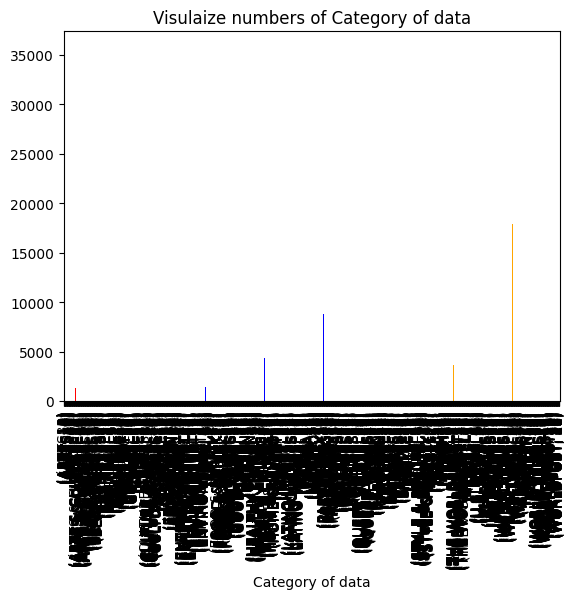

In [37]:
category_counts = [df[df['category'] == category].shape[0] for category in category_dict]
colors = ["skyblue"]
category_dict = {
    'ARTS': 0,
    'ARTS & CULTURE': 1,
    'BLACK VOICES': 2,
    'BUSINESS': 3,
    'COLLEGE': 4,
    'COMEDY': 5,
    'CRIME': 6,
    'CULTURE & ARTS': 7,
    'DIVORCE': 8,
    'EDUCATION': 9,
    'ENTERTAINMENT': 10,
    'ENVIRONMENT': 11,
    'FIFTY': 12,
    'FOOD & DRINK': 13,
    'GOOD NEWS': 14,
    'GREEN': 15,
    'HEALTHY LIVING': 16,
    'HOME & LIVING': 17,
    'IMPACT': 18,
    'LATINO VOICES': 19,
    'MEDIA': 20,
    'MONEY': 21,
    'PARENTING': 22,
    'PARENTS': 23,
    'POLITICS': 24,
    'QUEER VOICES': 25,
    'RELIGION': 26,
    'SCIENCE': 27,
    'SPORTS': 28,
    'STYLE': 29,
    'STYLE & BEAUTY': 30,
    'TASTE': 31,
    'TECH': 32,
    'THE WORLDPOST': 33,
    'TRAVEL': 34,
    'U.S. NEWS': 35,
    'WEDDINGS': 36, 
    'WEIRD NEWS' :37, 
     "WELLNESS":38, 
     "WOMEN":39, 
     "WORLD NEWS":40, 
     "WORLDPOST":41
}

df.groupby('category').category_code.value_counts().plot(kind = "bar", color = ["pink", "orange", "red", "yellow", "blue"])
plt.xlabel("Category of data")
plt.title("Visulaize numbers of Category of data")
plt.show()

In [33]:
colors = ["skyblue"]
category_dict = {
    'ARTS': 0,
    'ARTS & CULTURE': 1,
    'BLACK VOICES': 2,
    'BUSINESS': 3,
    'COLLEGE': 4,
    'COMEDY': 5,
    'CRIME': 6,
    'CULTURE & ARTS': 7,
    'DIVORCE': 8,
    'EDUCATION': 9,
    'ENTERTAINMENT': 10,
    'ENVIRONMENT': 11,
    'FIFTY': 12,
    'FOOD & DRINK': 13,
    'GOOD NEWS': 14,
    'GREEN': 15,
    'HEALTHY LIVING': 16,
    'HOME & LIVING': 17,
    'IMPACT': 18,
    'LATINO VOICES': 19,
    'MEDIA': 20,
    'MONEY': 21,
    'PARENTING': 22,
    'PARENTS': 23,
    'POLITICS': 24,
    'QUEER VOICES': 25,
    'RELIGION': 26,
    'SCIENCE': 27,
    'SPORTS': 28,
    'STYLE': 29,
    'STYLE & BEAUTY': 30,
    'TASTE': 31,
    'TECH': 32,
    'THE WORLDPOST': 33,
    'TRAVEL': 34,
    'U.S. NEWS': 35,
    'WEDDINGS': 36, 
    'WEIRD NEWS' :37, 
     "WELLNESS":38, 
     "WOMEN":39, 
     "WORLD NEWS":40, 
     "WORLDPOST":41
}

for category in category_dict:
   df_category = df[df['category'] == category]
   print(f"{category} = {df_category}")


ARTS =                                                      link   
44677   https://www.huffingtonpost.com/entry/an-alert-...  \
46526   https://www.huffingtonpost.com/entry/stage-doo...   
47136   https://www.huffingtonpost.com/entry/donna-que...   
47485   https://www.huffingtonpost.com/entry/top-5-siz...   
47655   https://www.huffingtonpost.com/entry/defending...   
...                                                   ...   
133555  https://www.huffingtonpost.com/entry/mark-inne...   
133574  https://www.huffingtonpost.com/entry/boys-in-t...   
133607  https://www.huffingtonpost.com/entry/first-nig...   
133631  https://www.huffingtonpost.com/entry/artists-s...   
133651  https://www.huffingtonpost.com/entry/aisle-vie...   

                                                 headline category   
44677   An Alert, Well-Hydrated Artist in No Acute Dis...     ARTS  \
46526   Stage Door: Ute Lemper's Songs From The Broken...     ARTS   
47136                           Donna Quesada: Art

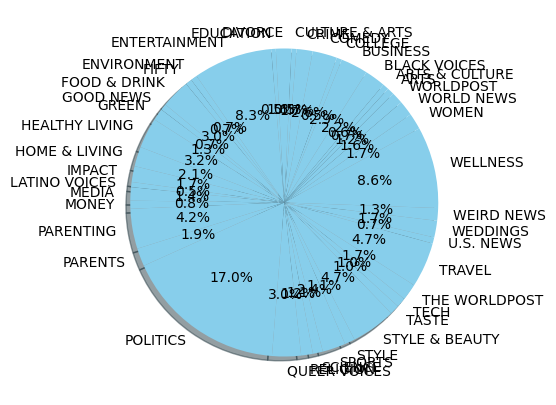

In [35]:
category_counts = [df[df['category'] == category].shape[0] for category in category_dict]
pie = plt.pie(category_counts, labels = list(category_dict.keys()),
              autopct = "%1.1f%%",
              shadow = True,
              colors = colors,
              startangle = 45)
fig = plt.gcf()
fig.set_size_inches(5,5)
plt.show()

### Word cloud module to show the category-related words:

ARTS related words:


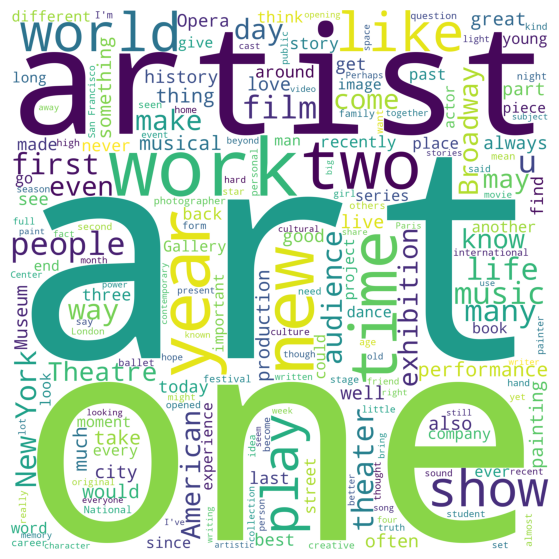

ARTS & CULTURE related words:


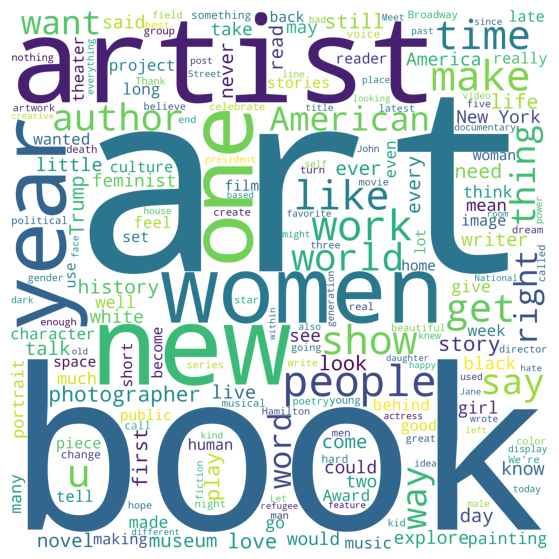

BLACK VOICES related words:


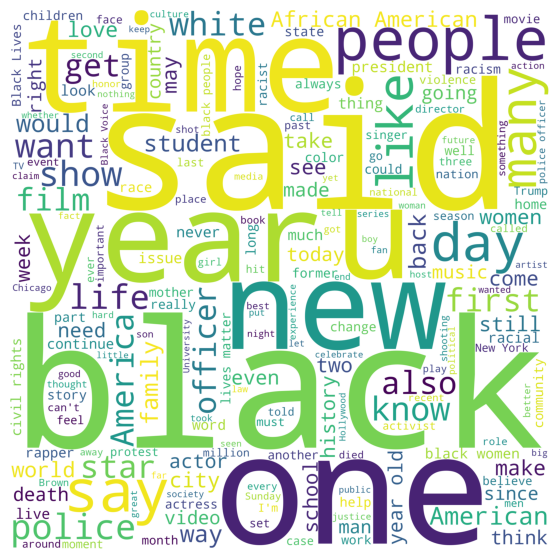

BUSINESS related words:


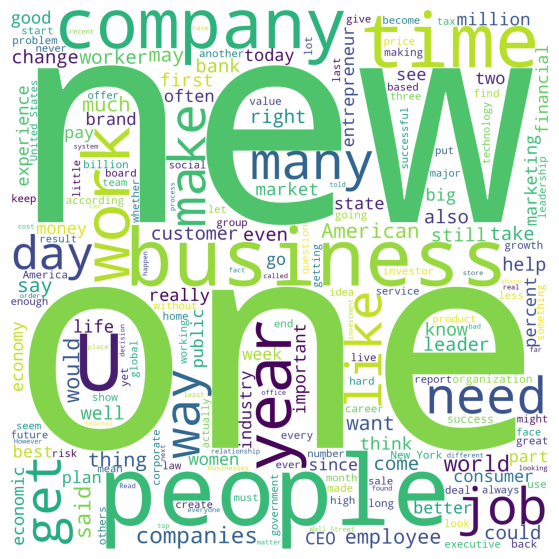

COLLEGE related words:


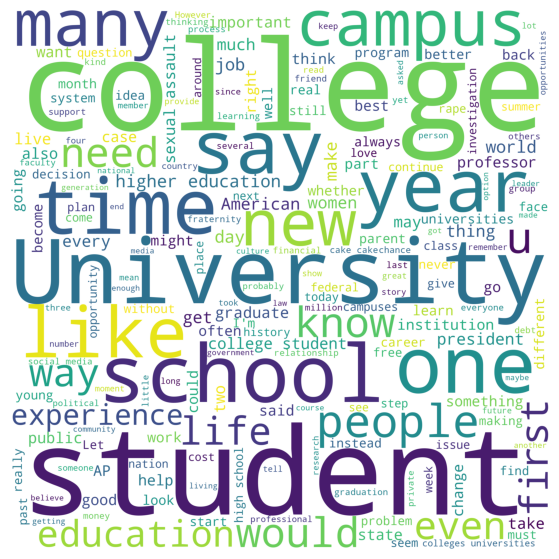

COMEDY related words:


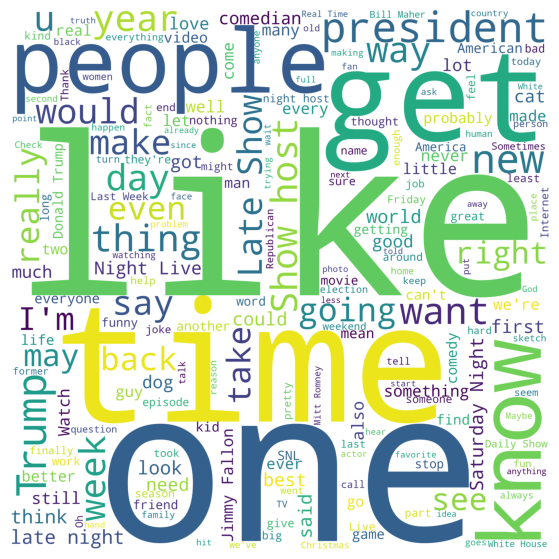

CRIME related words:


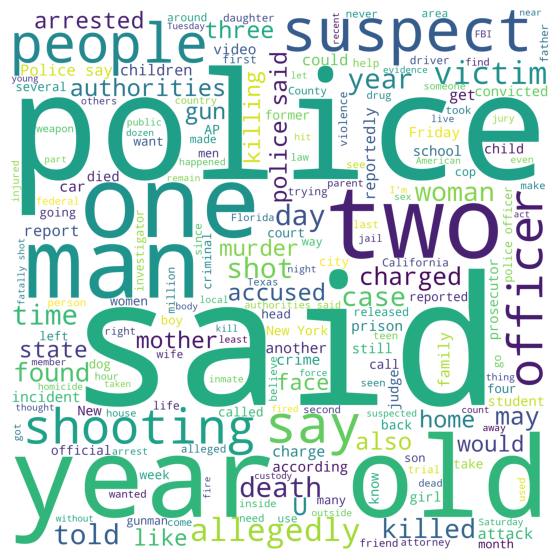

CULTURE & ARTS related words:


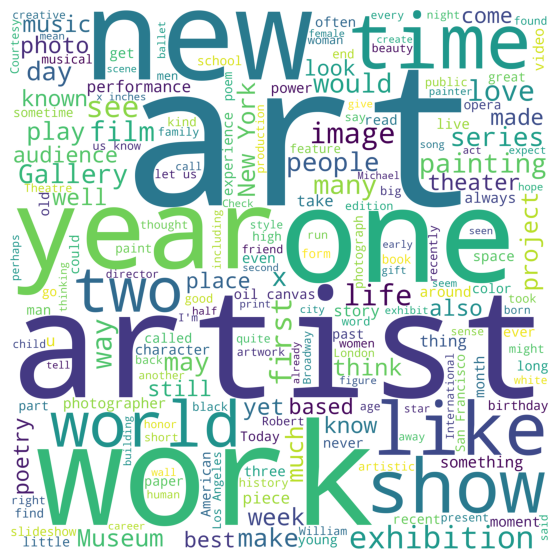

DIVORCE related words:


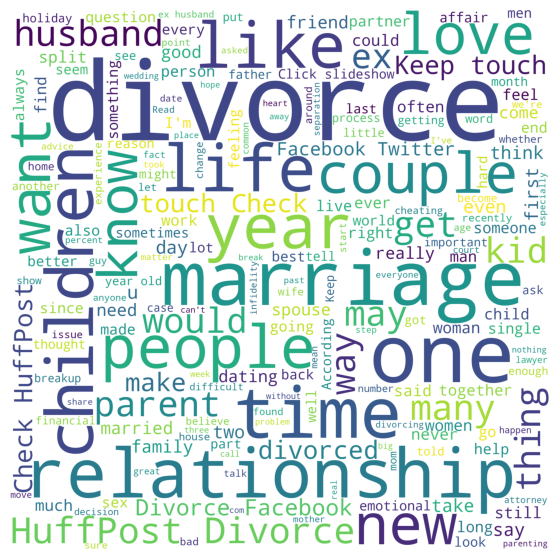

EDUCATION related words:


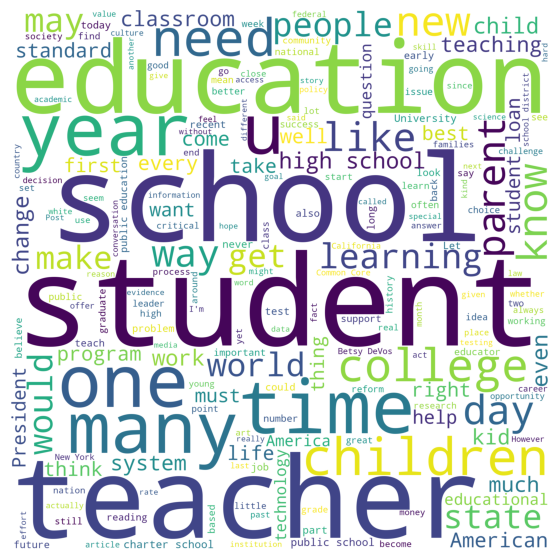

ENTERTAINMENT related words:


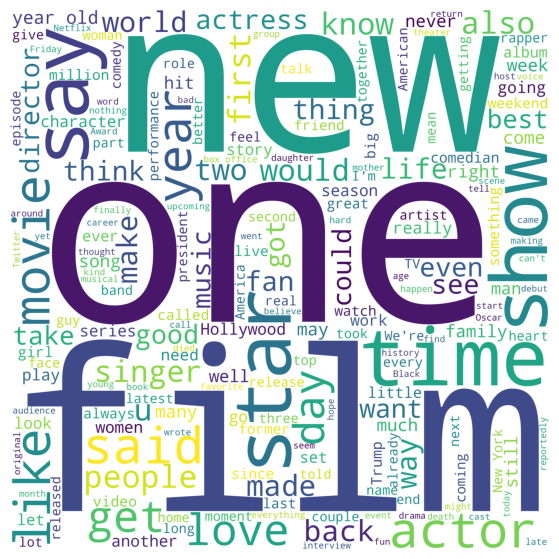

ENVIRONMENT related words:


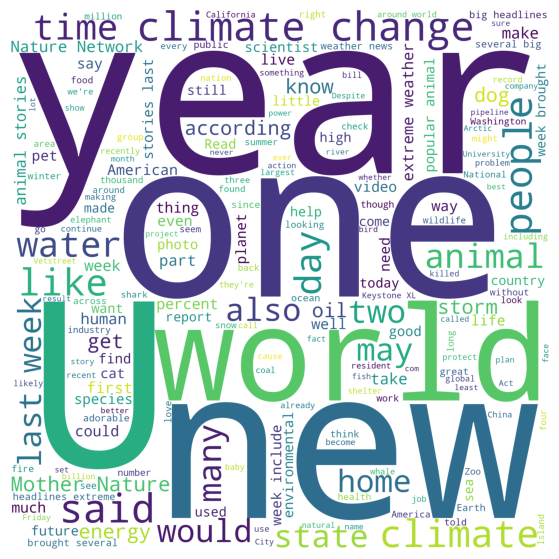

FIFTY related words:


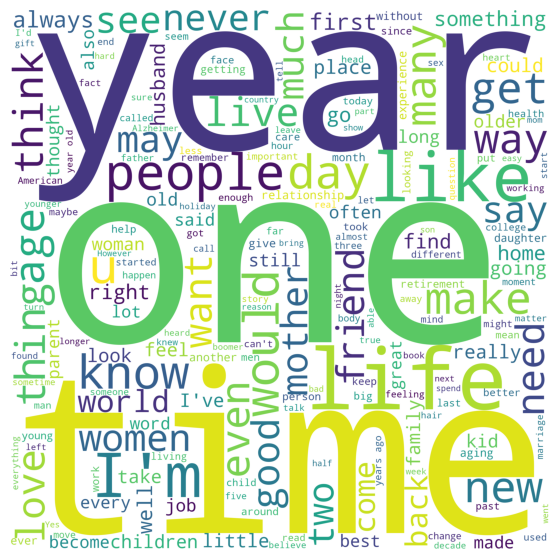

FOOD & DRINK related words:


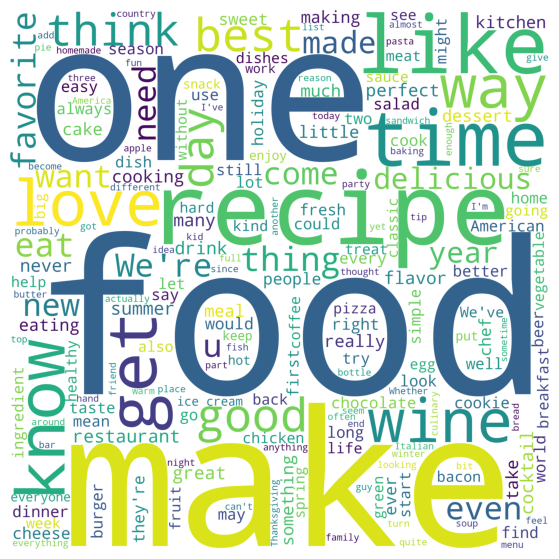

GOOD NEWS related words:


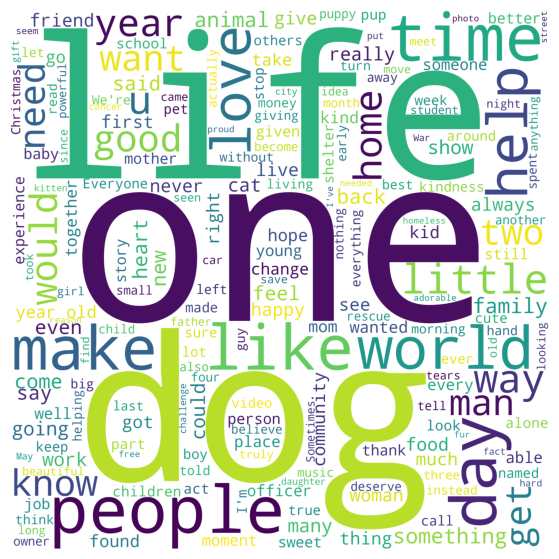

GREEN related words:


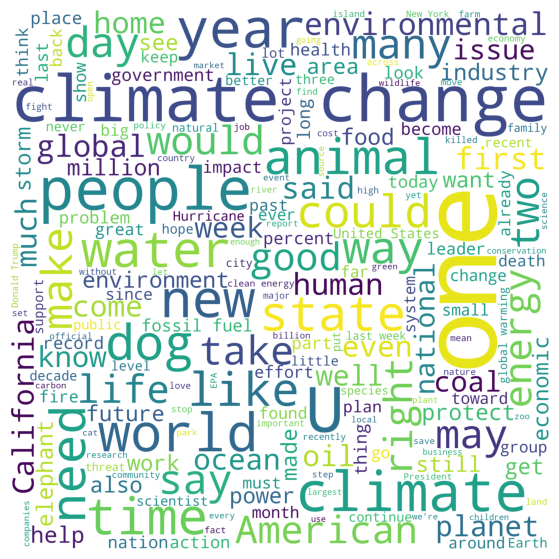

HEALTHY LIVING related words:


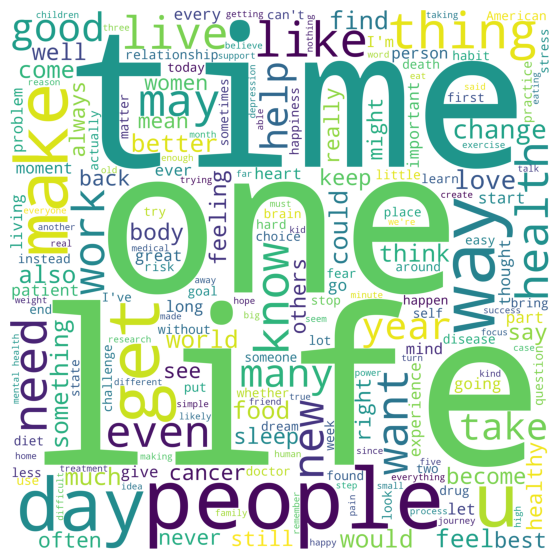

HOME & LIVING related words:


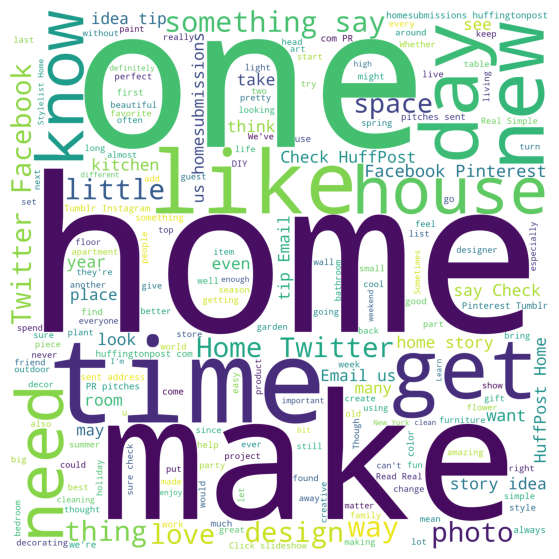

IMPACT related words:


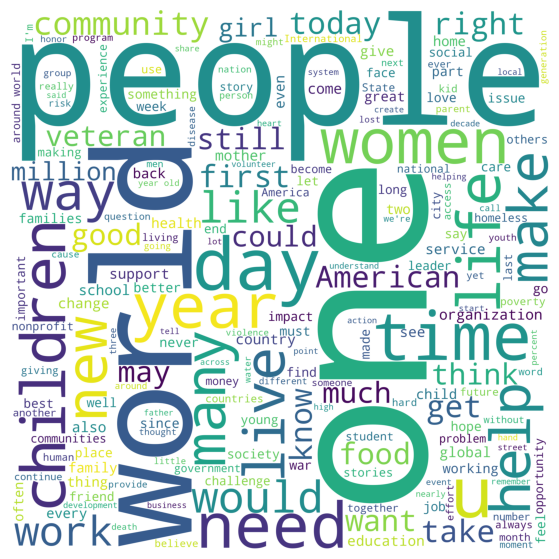

LATINO VOICES related words:


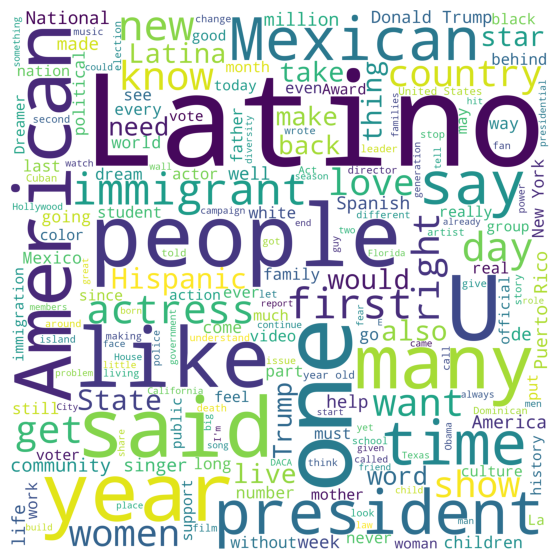

MEDIA related words:


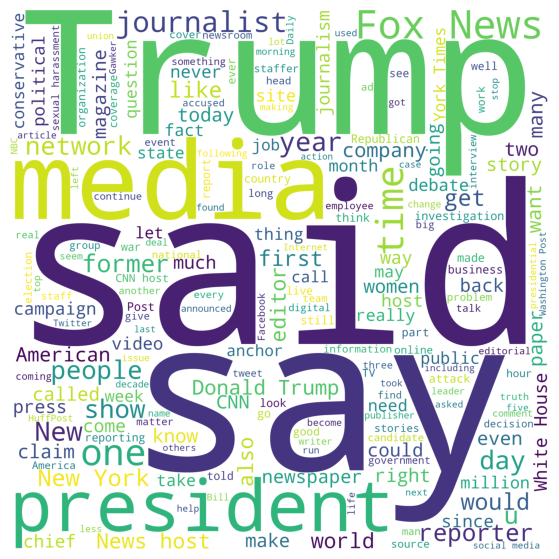

MONEY related words:


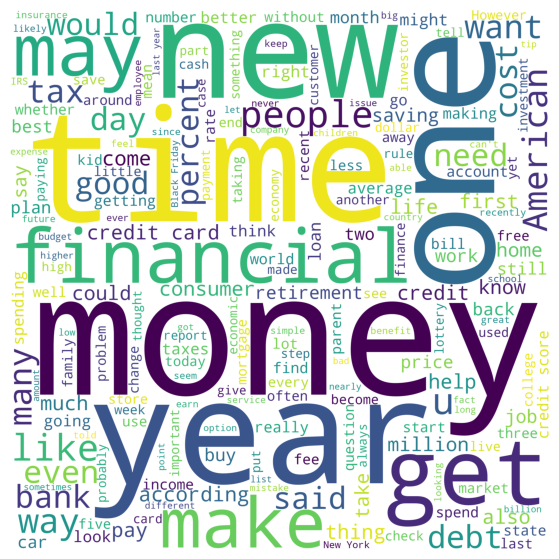

PARENTING related words:


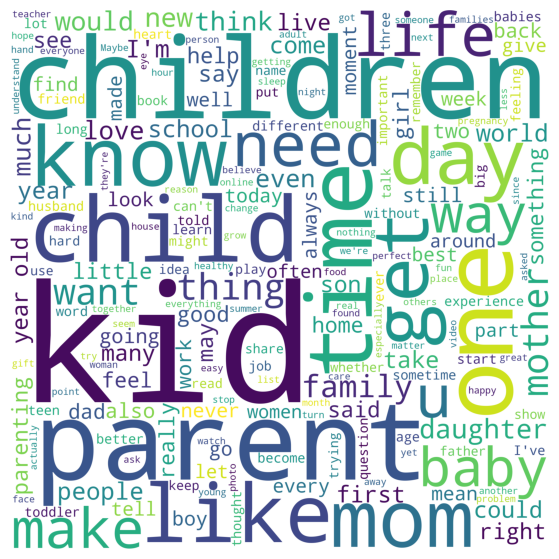

PARENTS related words:


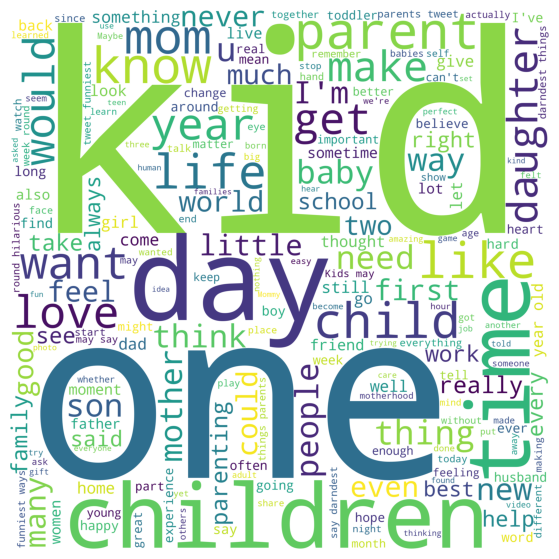

POLITICS related words:


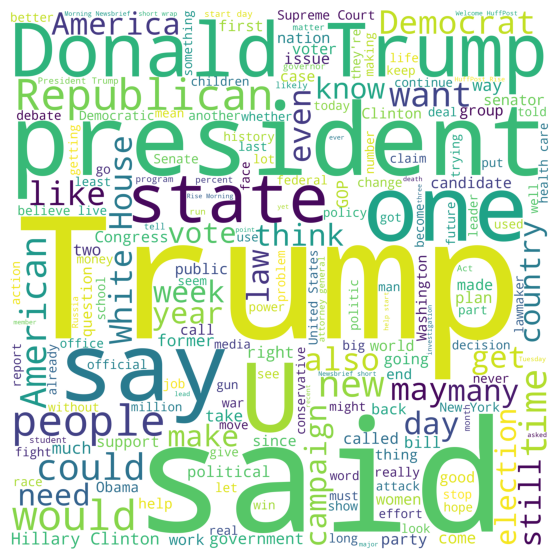

QUEER VOICES related words:


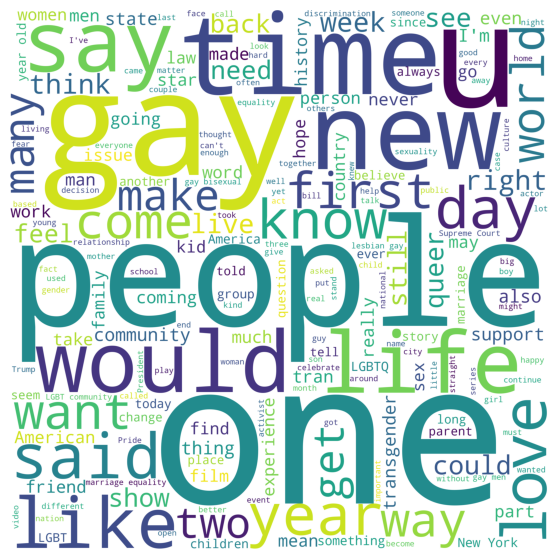

RELIGION related words:


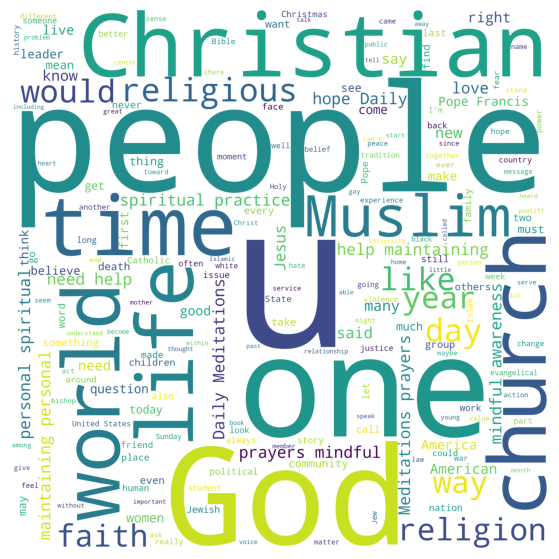

SCIENCE related words:


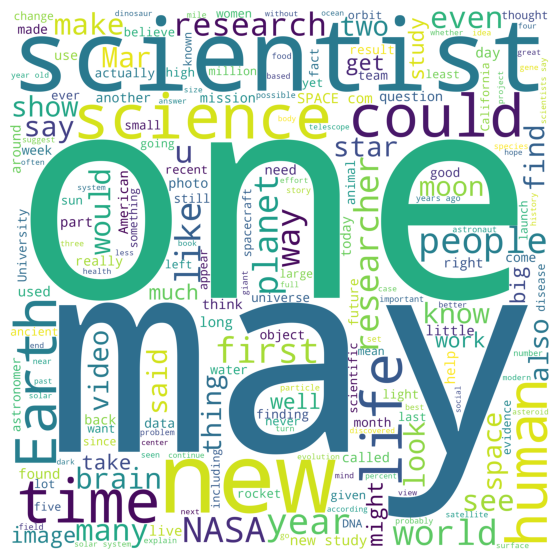

SPORTS related words:


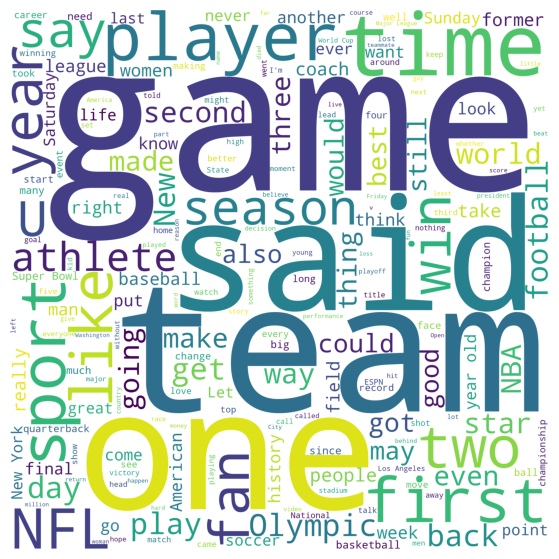

STYLE related words:


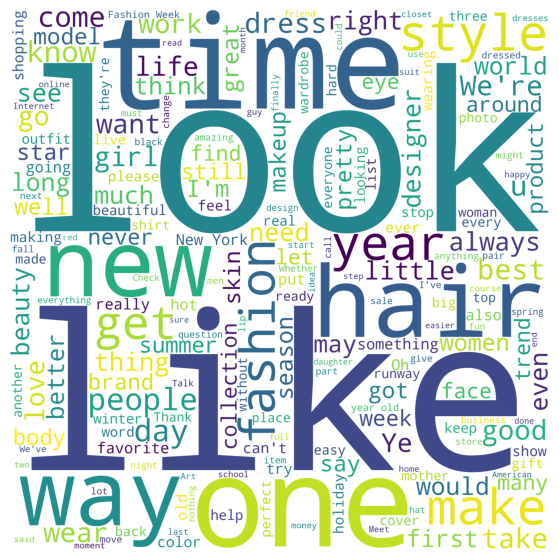

STYLE & BEAUTY related words:


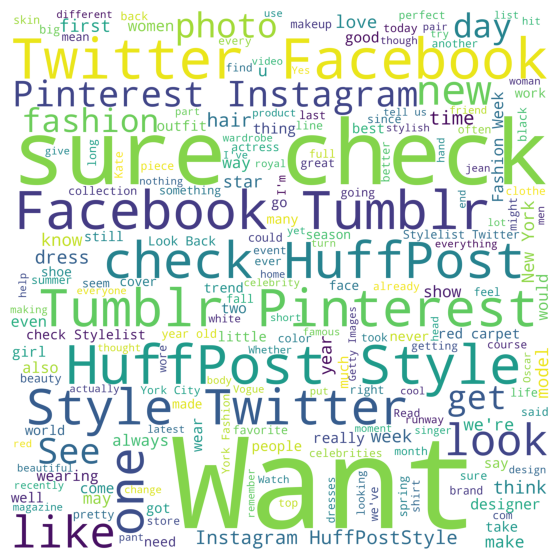

TASTE related words:


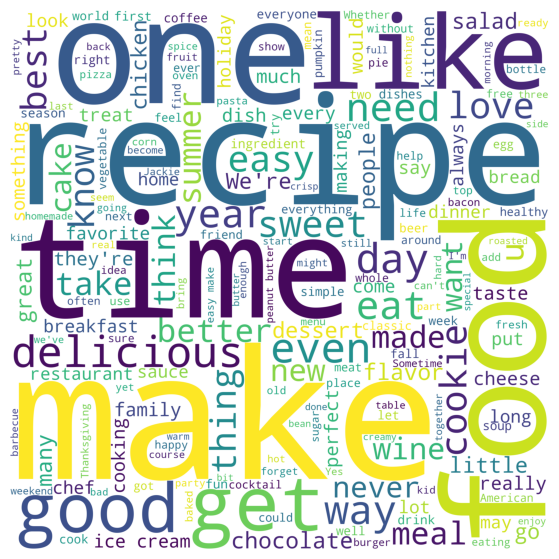

TECH related words:


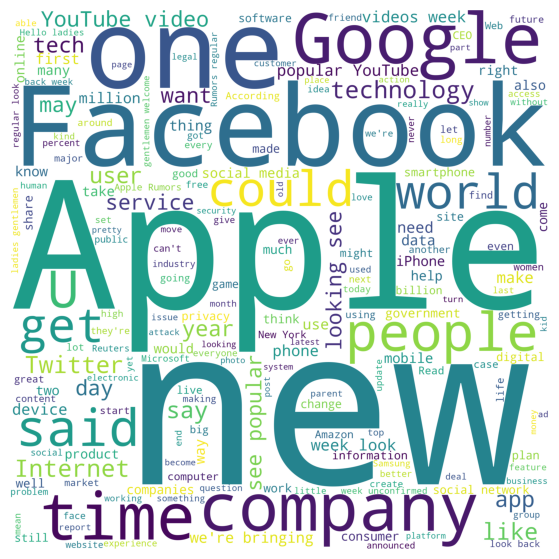

THE WORLDPOST related words:


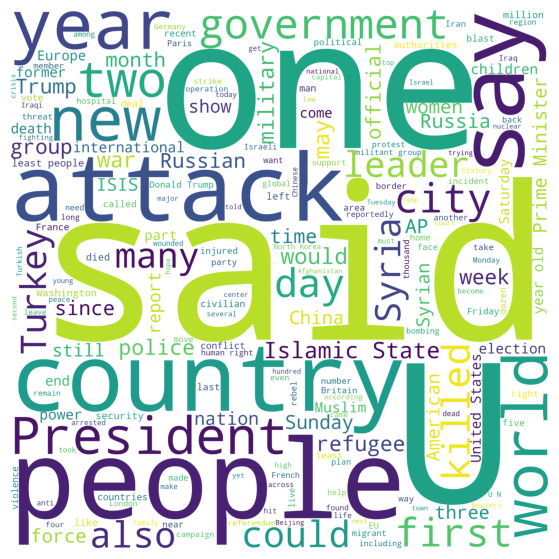

TRAVEL related words:


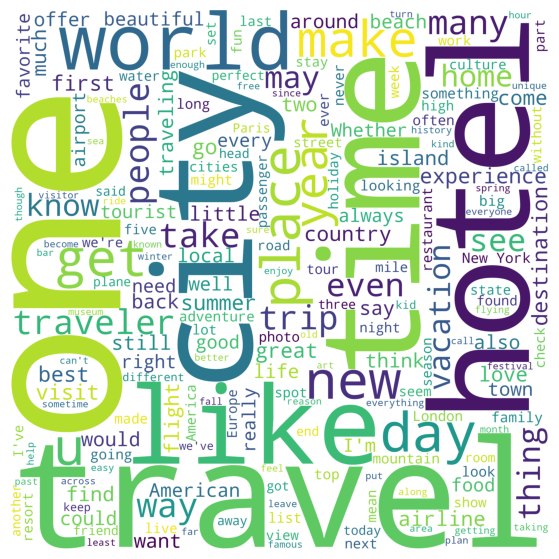

U.S. NEWS related words:


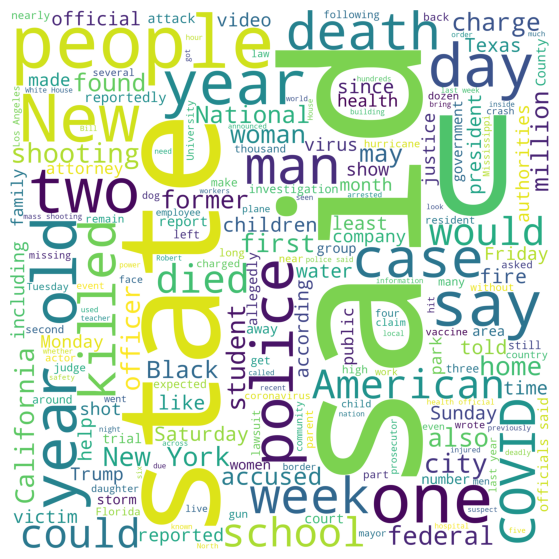

WEDDINGS related words:


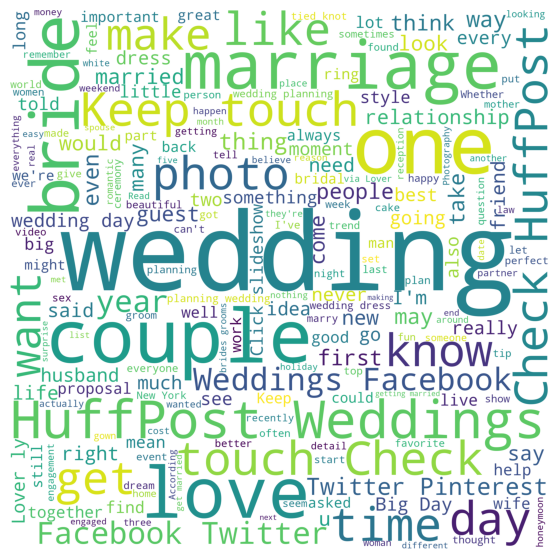

WEIRD NEWS related words:


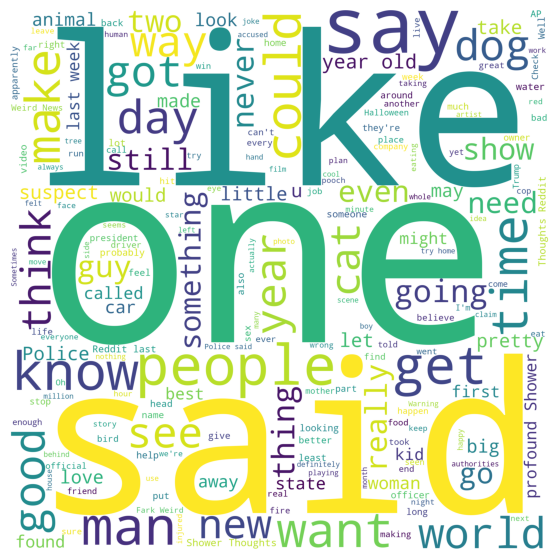

WELLNESS related words:


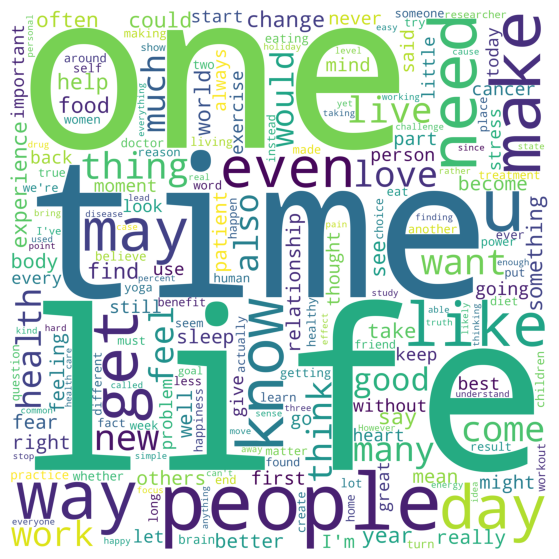

WOMEN related words:


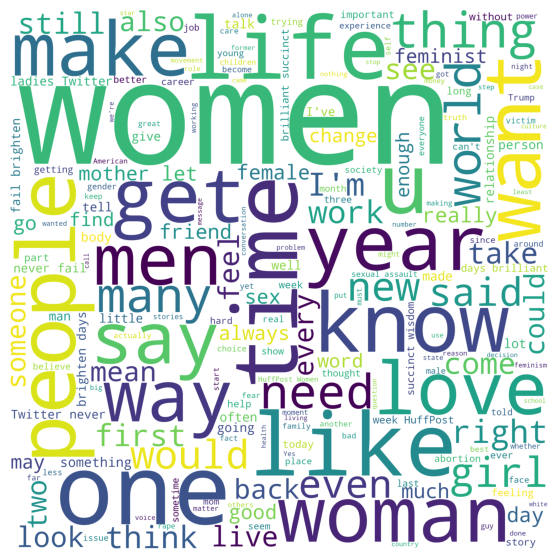

WORLD NEWS related words:


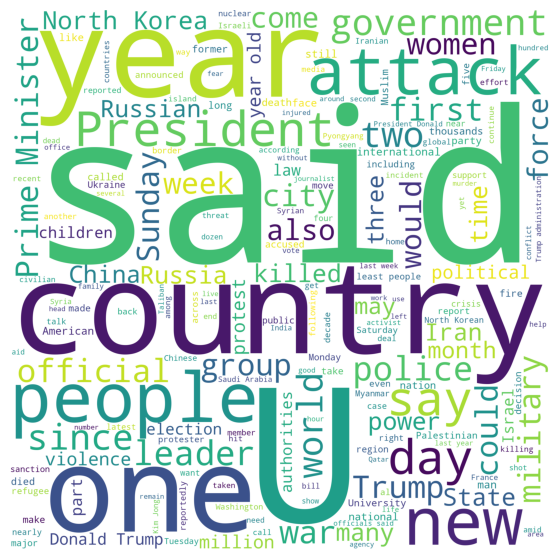

WORLDPOST related words:


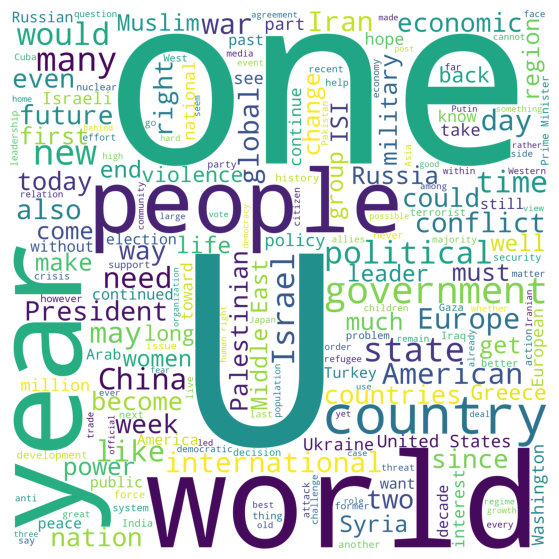

In [41]:
for category in category_dict:
   df_category = df[df['category'] == category]
   print(f"{category} related words:")
   words = df_category['short_description'].str.cat(sep=' ')
   cleaned_word = [word for word in words.split() if (word not in stop and word != "news" and word != "text")]
   cleaned_word = " ".join(cleaned_word)
   wordcloud = WordCloud(stopwords = stop, background_color = "white", width = 2500, height = 2500).generate(cleaned_word)
   plt.figure(1, figsize = (10,7))
   plt.imshow(wordcloud)
   plt.axis("off")
   plt.show()


### Show Text Column of Dataset:

In [43]:
short_description = df["short_description"]
short_description.head(10)

0    Health experts said it is too early to predict...
1    He was subdued by passengers and crew when he ...
2    "Until you have a dog you don't understand wha...
3    "Accidentally put grown-up toothpaste on my to...
4    Amy Cooper accused investment firm Franklin Te...
5    The 63-year-old woman was seen working at the ...
6    "Who's that behind you?" an anchor for New Yor...
7    More than half a million people remained witho...
8    In "Mija," director Isabel Castro combined mus...
9    White House officials say the crux of the pres...
Name: short_description, dtype: object

### Show Category Column of Dataset:

In [45]:
category = df['category']
category.head(10)

0         U.S. NEWS
1         U.S. NEWS
2            COMEDY
3         PARENTING
4         U.S. NEWS
5         U.S. NEWS
6         U.S. NEWS
7        WORLD NEWS
8    CULTURE & ARTS
9        WORLD NEWS
Name: category, dtype: category
Categories (42, object): ['ARTS', 'ARTS & CULTURE', 'BLACK VOICES', 'BUSINESS', ..., 'WELLNESS', 'WOMEN', 'WORLD NEWS', 'WORLDPOST']

### Remove all codes:

In [47]:
def remove_tags(text):
  remove = re.compile(r'')
  return re.sub(remove, '', text)
df['Text'] = df['short_description'].apply(remove_tags)

### Remove special all characters:

In [48]:
def special_char(text):
  reviews = ''
  for x in text:
    if x.isalnum():
      reviews = reviews + x
    else:
      reviews = reviews + ' '
  return reviews
df['Text'] = df['short_description'].apply(special_char)

### Converting everything (all articles) into lowercase for uniformity:

In [49]:
def convert_lower(text):
   return text.lower()
df['short_description'] = df['short_description'].apply(convert_lower)
df['short_description'][1]

"he was subdued by passengers and crew when he fled to the back of the aircraft after the confrontation, according to the u.s. attorney's office in los angeles."

### Removing all stopwords:

In [53]:
def remove_stopwords(text):
  stop_words = set(stopwords.words('english'))
  words = word_tokenize(text)
  return [x for x in words if x not in stop_words]
df['short_description'] = df['short_description'].apply(remove_stopwords)
# df['short_description'][1]

### Lemmatizing all words:

In [52]:
def lemmatize_word(text):
  wordnet = WordNetLemmatizer()
  return " ".join([wordnet.lemmatize(word) for word in text])
df['short_description'] = df['short_description'].apply(lemmatize_word)
df['short_description'][1]

"subdued passenger crew fled back aircraft confrontation , according u.s. attorney 's office los angeles ."

### After cleaning, our dataset looks like this:

In [54]:
df

,link,headline,category,short_description,authors,date,category_code,Text
0,https://www.huffpost.com/entry/covid-boosters-...,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,"[health, expert, said, early, predict, whether...","Carla K. Johnson, AP",2022-09-23,35,Health experts said it is too early to predict...
1,https://www.huffpost.com/entry/american-airlin...,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,"[subdued, passenger, crew, fled, back, aircraf...",Mary Papenfuss,2022-09-23,35,He was subdued by passengers and crew when he ...
2,https://www.huffpost.com/entry/funniest-tweets...,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"[``, dog, n't, understand, could, eaten, ., ``]",Elyse Wanshel,2022-09-23,5,Until you have a dog you don t understand wha...
3,https://www.huffpost.com/entry/funniest-parent...,The Funniest Tweets From Parents This Week (Se...,PARENTING,"[``, accidentally, put, grown-up, toothpaste, ...",Caroline Bologna,2022-09-23,22,Accidentally put grown up toothpaste on my to...
4,https://www.huffpost.com/entry/amy-cooper-lose...,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,"[amy, cooper, accused, investment, firm, frank...",Nina Golgowski,2022-09-22,35,Amy Cooper accused investment firm Franklin Te...
...,...,...,...,...,...,...,...,...
209522,https://www.huffingtonpost.com/entry/rim-ceo-t...,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,TECH,"[verizon, wireless, &, already, promoting, lte...","Reuters, Reuters",2012-01-28,32,Verizon Wireless and AT T are already promotin...
209523,https://www.huffingtonpost.com/entry/maria-sha...,Maria Sharapova Stunned By Victoria Azarenka I...,SPORTS,"[afterward, ,, azarenka, ,, effusive, press, n...",,2012-01-28,28,Afterward Azarenka more effusive with the pr...
209524,https://www.huffingtonpost.com/entry/super-bow...,"Giants Over Patriots, Jets Over Colts Among M...",SPORTS,"[leading, super, bowl, xlvi, ,, talked, game, ...",,2012-01-28,28,Leading up to Super Bowl XLVI the most talked...
209525,https://www.huffingtonpost.com/entry/aldon-smi...,Aldon Smith Arrested: 49ers Linebacker Busted ...,SPORTS,"[correction, :, earlier, version, story, incor...",,2012-01-28,28,CORRECTION An earlier version of this story i...


In [56]:
x = df['short_description']
y = df['category_code']

### Taks 2: Apply at least two different techniques/algorithm for classifying the text in the given dataset to develop a model.

In [58]:
x = np.array(df.iloc[:,0].values)
y = np.array(df.category_code.values)
cv = CountVectorizer(max_features = 5000)
x = cv.fit_transform(df.Text).toarray()
print("X.shape = ", x.shape)
print("y.shape = ", y.shape)

X.shape =  (209527, 5000)
y.shape =  (209527,)


In [59]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0, shuffle = True)
print(len(x_train))
print(len(x_test))

146668
62859


In [72]:
perform_list = [ ]

In [62]:
def run_model(model_name, est_c, est_pnlty):
    mdl = ''
    if model_name == 'Logistic Regression':
        mdl = LogisticRegression()
    elif model_name == 'Random Forest':
        mdl = RandomForestClassifier(n_estimators=100 ,criterion='entropy' , random_state=0)
    elif model_name == 'Multinomial Naive Bayes':
        mdl = MultinomialNB(alpha=1.0,fit_prior=True)
    elif model_name == 'Support Vector Classifer':
        mdl = SVC()
    elif model_name == 'Decision Tree Classifier':
        mdl = DecisionTreeClassifier()
    elif model_name == 'K Nearest Neighbour':
        mdl = KNeighborsClassifier(n_neighbors=10 , metric= 'minkowski' , p = 4)
    elif model_name == 'Gaussian Naive Bayes':
        mdl = GaussianNB()
    oneVsRest = OneVsRestClassifier(mdl)
    oneVsRest.fit(x_train, y_train)
    y_pred = oneVsRest.predict(x_test)
    
    # Performance metrics
    accuracy = round(accuracy_score(y_test, y_pred) * 100, 2)
    
    # Get precision, recall, f1 scores
    precision, recall, f1score, support = score(y_test, y_pred, average='micro')
    print(f'Test Accuracy Score of Basic {model_name}: % {accuracy}')
    print(f'Precision : {precision}')
    print(f'Recall : {recall}')
    print(f'F1-score : {f1score}')
    
    # Add performance parameters to list
    perform_list.append(dict([
    ('Model', model_name),
    ('Test Accuracy', round(accuracy, 2)),
    ('Precision', round(precision, 2)),
    ('Recall', round(recall, 2)),
    ('F1', round(f1score, 2))
    ]))

In [73]:
run_model('Logistic Regression', est_c=None, est_pnlty=None)

In [ ]:
run_model('Random Forest', est_c=None, est_pnlty=None)

In [ ]:
run_model('Multinomial Naive Bayes', est_c=None, est_pnlty=None)

In [ ]:
run_model('Multinomial Naive Bayes', est_c=None, est_pnlty=None)

In [ ]:
run_model('Decision Tree Classifier', est_c=None, est_pnlty=None)

In [ ]:
run_model('K Nearest Neighbour', est_c=None, est_pnlty=None)

In [ ]:
run_model('Gaussian Naive Bayes', est_c=None, est_pnlty=None)

In [ ]:
model_performance = pd.DataFrame(data=perform_list)
model_performance = model_performance[['Model', 'Test Accuracy', 'Precision', 'Recall', 'F1']]
model_performance

In [ ]:
model = model_performance["Model"]
max_value = model_performance["Test Accuracy"].max()
print("The best accuracy of model is", max_value,"from Random")

In [ ]:
classifier = RandomForestClassifier(n_estimators=100 ,criterion='entropy' , random_state=0).fit(x_train, y_train)
classifier
y_pred = classifier.predict(x_test)

In [ ]:
y_pred1 = cv.transform(['Hour ago, I contemplated retirement for a lot of reasons. I felt like people were not sensitive enough to my injuries. I felt like a lot of people were backed, why not me? I have done no less. I have won a lot of games for the team, and I am not feeling backed, said Ashwin'])
yy = classifier.predict(y_pred1)
result = ""
if yy == [0]:
  result = "Business News"
elif yy == [1]:
  result = "Tech News"
elif yy == [2]:
  result = "Politics News"
elif yy == [3]:
  result = "Sports News"
elif yy == [1]:
  result = "Entertainment News"
print(result)

#### Conclusion:
Finally after doing Data cleaning and Data Preprocessing (cleaning data, train_test_split model, creating a bag of words NLP model, and machine learning model) we got the accuracy scores and we can say that Random Forest Classification gives the best accuracy among all machine learning models.

And at last, we also predict the category of different news articles.